Luke Abbatessa, Jocelyn Ju, Yuting Zheng
DS4400
Final Project
Spring 2023
shoppers-purchase-intention.ipynb

Consulted UC Irvine Machine Learning Repository for referencing the dataset
https://archive-beta.ics.uci.edu/dataset/468/online+shoppers+purchasing+intention+dataset

In [1]:
# Import the necessary libraries/packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import random as rnd
import mltools as ml
from collections import Counter
import dtree as tree
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus
from tensorflow.python.keras import Input
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten
import tensorflow as tf
from keras.optimizers import Adam
from operator import itemgetter
from numpy.random import seed
from tensorflow import random, config

In [2]:
# Set seed
seed(1)

random.set_seed(1)
config.experimental.enable_op_determinism()

rnd.seed(2)

In [3]:
# Instantiate the necessary constants
FILENAME = "online_shoppers_intention.csv"

# Helper Functions

In [4]:
def read_file(filename, header=True):
    """
    Read in a .csv file as a Pandas dataframe
    Parameters: filename - the name of a .csv file (a string),
                header - confirms whether a .csv file contains a header (a boolean)
    Returns: df - a dataframe
    """
    if header:
        df = pd.read_csv(filename)
    else:
        df = pd.read_csv(filename, header=None)
    return df

In [5]:
def gauge_missing_vals(df):
    """
    Counts the missing values both by column and by row
    Parameters: df - a dataframe
    Returns: the missing values of the df both by column and by row 
    """
    col_missing_vals = df.isnull().sum()
    row_missing_vals = df.isnull().sum(axis=1).sort_values(ascending=False)
    return col_missing_vals, row_missing_vals

In [6]:
def cross_validation_perceptron(data, model):
    """
    Runs cross validation on perceptron algorithm
    Parameters: data - a dataframe
                model - a perceptron function
    Returns nothing
    """
    # Calculate the weights, mpes, folds, and accuracries for the model
    fold_weights, fold_mpes, fold_epochs, fold_accuracies = model(data)
    
    # Create X values and y values from data
    X = data[data.columns[:-1]]
    X = X.to_numpy()
    y = data[data.columns[-1]]
    
    # Calculate the score and y predictions and get the five metrics of the prediction vs actual
    score, ypred = ml.predict(X, fold_weights)
    five_metrics = ml.metrics(y, ypred)
    print("Below are the metrics with regards to the online shoppers df.")
    print(" ")
    print(five_metrics)
    print(" ")
    
    # Plot MPE vs. Epoch on a line plot
    plt.plot(fold_epochs, fold_mpes)
    plt.xlabel("Epoch Number")
    plt.ylabel("Mean Perceptron Error (MPE)")
    plt.title("Mean Perceptron Error (MPE) Across Epochs")
    plt.show()
    print(" ")
    
    # Plot Model Accuracy vs. Epoch on a line plot
    plt.plot(fold_epochs, fold_accuracies)
    plt.xlabel("Epoch Number")
    plt.ylabel("Model Accuracy (% Correct Predictions)")
    plt.title("Model Accuracy Across Epochs")
    plt.show()
    print(" ")

In [7]:
def generate_table(df, columns, n=0):
    """
    Generate a dataframe with attribute columns and metrics column.
    Takes in a counter value (n) and a dataframe (df).
    Returns a dataframe.
    """
    # Initiate empty lists
    df_rows = []

    # Implement a while loop to iterate over a set number of models
    while n < 20:
        
        # Set X and y values from df
        X = df[df.columns[:-1]]
        y = df[df.columns[-1]]
            
        # Take a random subset of a random number of attributes
        subset = X.sample(n=rnd.randint(1, len(X.columns)), axis=1)
    
        # Create a list of zeros
        attr_metric_lst = [0] * len(X.columns)
    
        # Compare the attributes of shop_df to those in the subset; 
        # if they match, increment the respective value in the list by 1
        for i in range(len(X.columns)):
            for j in range(len(attr_metric_lst)):
                if i == j and X.columns[i] in subset.columns:
                    attr_metric_lst[j] = 1
    
        # Add an additional column to the resulting table 
        # signifying the number of features used in the model
        num_counts = dict(Counter(attr_metric_lst))
        attr_metric_lst.append(num_counts[1])
    
        # Attach the y column to the subset, 
        # and run the perceptron algorithm on the subset of attributes
        subset["Revenue"] = y
        subset_weights, subset_mpes, subset_epochs, subset_accuracies = ml.perceptron(subset)
    
        # Add the values of the five metrics of the model to the list above
        subset_X = subset[subset.columns[:-1]]
        subset_X = subset_X.to_numpy()
        subset_y = subset[subset.columns[-1]]
        
        # Calculate the score and make predictions
        score, ypred = ml.predict(subset_X, subset_weights)
        five_metrics = ml.metrics(subset_y, ypred)
        
        # Append each of the metric values into its corresponding list
        attr_metric_lst.append(round(five_metrics["accuracy"], 4))
        attr_metric_lst.append(round(five_metrics["sensitivity"], 4))
        attr_metric_lst.append(round(five_metrics["specificity"], 4))
        attr_metric_lst.append(round(five_metrics["precision"], 4))
        attr_metric_lst.append(round(five_metrics["f1-score"], 4))
    
        # Add the lists into a nested list
        df_rows.append(attr_metric_lst)
        
        # Increase counter value by 1
        n += 1
    
        # Create a dataframe from the nested list with a list of pre-defined columns
        model_table = pd.DataFrame(df_rows, columns=columns)
    
    return model_table

In [8]:
def plot_model_metrics(model_table):
    """
    Plot model metrics value in a scatter plot
    Takes in a model_table (df)
    Returns nothing
    """
    # Plot a scatterplot visualizing specificity vs sensitivity for all 20 models (one point per model)
    plt.scatter(model_table["specificity"], 
                model_table["sensitivity"], 
                c=model_table["num_features"], 
                cmap="plasma")

    # Establish a colorbar, axes labels, and title, and plot the graph
    plt.colorbar(label="Number of Features", orientation="vertical")
    plt.xlabel("Specificity")
    plt.ylabel("Sensitivity")
    plt.title("Visualizing Specificity Vs. Sensitivity Across "
              "Perceptron Models")

    plt.show()

In [9]:
def cross_validation_sklearn_perceptron(data):
    """
    Runs cross validation on given data set in a df
    Takes in data, a dataframe
    Returns five_metrics, a dictionary
    """
    # Compare the perceptron model against scikit-learn's model
    w, purchase_pred = ml.perceptron_scikit(data)
    
    # Set X and y values from data
    X = data[data.columns[:-1]]
    X = X.to_numpy()
    y = data[data.columns[-1]]

    # Calculate score and prediction values
    score, ypred = ml.predict(X, w)
    
    # Calculate the five metrics score based on the prediction and the actual
    five_metrics = ml.metrics(y, purchase_pred)
        
    return five_metrics

# Read in the data

In [10]:
# Read in file
shop_df = read_file(FILENAME)
print(shop_df.head(10))

   Administrative  Administrative_Duration  Informational  \
0               0                      0.0              0   
1               0                      0.0              0   
2               0                      0.0              0   
3               0                      0.0              0   
4               0                      0.0              0   
5               0                      0.0              0   
6               0                      0.0              0   
7               1                      0.0              0   
8               0                      0.0              0   
9               0                      0.0              0   

   Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                     0.0               1                 0.000000   
1                     0.0               2                64.000000   
2                     0.0               1                 0.000000   
3                     0.0               2       

# Data Cleaning/Preprocessing

# Change variable data types

In [11]:
# Print information for shop_df
print(shop_df.info())  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

The variable "Month" consists of object-type instances, however it should consist of strings.

The variable "VisitorType" consists of object-type instances, however it should consist of strings.

In [12]:
# Convert df column data into its appropriate value types
shop_df["Month"] = shop_df["Month"].astype(pd.StringDtype())
shop_df["VisitorType"] = shop_df["VisitorType"].astype(pd.StringDtype())
print(shop_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  string 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

# Impute/delete missing values

In [13]:
# Check for missing values in df rows and columns
shop_col_missing_vals, \
shop_row_missing_vals = gauge_missing_vals(shop_df)

print(shop_col_missing_vals)
print(" ")
print(shop_row_missing_vals)

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64
 
0        0
8283     0
8213     0
8214     0
8215     0
        ..
4113     0
4114     0
4115     0
4116     0
12329    0
Length: 12330, dtype: int64


There are no missing values in the dataframe, so no cleaning/preprocessing is required in this regard.

# Handle invalid data

In [14]:
# Check for value counts in each column of df
for col in shop_df.columns:
    print(shop_df[col].value_counts(dropna=False))

0     5768
1     1354
2     1114
3      915
4      765
5      575
6      432
7      338
8      287
9      225
10     153
11     105
12      86
13      56
14      44
15      38
16      24
17      16
18      12
19       6
24       4
22       4
23       3
21       2
20       2
27       1
26       1
Name: Administrative, dtype: int64
0.000000      5903
4.000000        56
5.000000        53
7.000000        45
11.000000       42
              ... 
68.014286        1
362.300000       1
90.700000        1
760.900000       1
150.357143       1
Name: Administrative_Duration, Length: 3335, dtype: int64
0     9699
1     1041
2      728
3      380
4      222
5       99
6       78
7       36
9       15
8       14
10       7
12       5
14       2
16       1
11       1
24       1
13       1
Name: Informational, dtype: int64
0.00      9925
9.00        33
7.00        26
10.00       26
6.00        26
          ... 
246.80       1
274.00       1
13.40        1
223.15       1
211.25       1
Name: Informati

All the unique values for all the variables make logical sense, so no data cleaning/preprocessing is required in this regard.

# Remove outliers

In [15]:
# For each column in df, get a descriptiotn of the data
for col in shop_df.columns:
    print(shop_df[col].describe())
    print(" ")

count    12330.000000
mean         2.315166
std          3.321784
min          0.000000
25%          0.000000
50%          1.000000
75%          4.000000
max         27.000000
Name: Administrative, dtype: float64
 
count    12330.000000
mean        80.818611
std        176.779107
min          0.000000
25%          0.000000
50%          7.500000
75%         93.256250
max       3398.750000
Name: Administrative_Duration, dtype: float64
 
count    12330.000000
mean         0.503569
std          1.270156
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         24.000000
Name: Informational, dtype: float64
 
count    12330.000000
mean        34.472398
std        140.749294
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2549.375000
Name: Informational_Duration, dtype: float64
 
count    12330.000000
mean        31.731468
std         44.475503
min          0.000000
25%          7.000000
50%         18

All the unique values for all the variables take on expected values, so no data cleaning/preprocessing is required in this regard.

# Drop duplicate rows

In [16]:
# Check for shape of df
print(shop_df.shape)

# Drop duplicates
shop_df.drop_duplicates(inplace=True)

# Check shape for df after duplicates are dropped
print(shop_df.shape)

(12330, 18)
(12205, 18)


It appears that the original dataframe had 125 duplicate rows, all of which were dropped.

# Cast strings to integers

Consulted stack overflow for replacing string values in a pandas dataframe to integers
https://stackoverflow.com/questions/31848877/how-to-replace-string-values-in-pandas-dataframe-to-integers

In [17]:
# Convert strings into integers 
month_dct = {"Feb": 2, "Mar": 3, "May": 5, "June": 6, "Jul": 7, "Aug": 8, "Sep": 9, "Oct": 10, "Nov": 11, "Dec": 12}
shop_df["Month"] = shop_df["Month"].apply(lambda x: month_dct[x])

visitor_dct = {"Returning_Visitor": 0, "New_Visitor": 1, "Other": 2}
shop_df["VisitorType"] = shop_df["VisitorType"].apply(lambda x: visitor_dct[x])

# Change boolean values to integers

In [18]:
# Change data type of df column
shop_df["Revenue"] = shop_df["Revenue"].astype(int)
shop_df["Weekend"] = shop_df["Weekend"].astype(int)

# Shuffle the data

In [19]:
# Shuffle the data
shop_df = shop_df.sample(frac=1)

# Exploratory Data Analysis

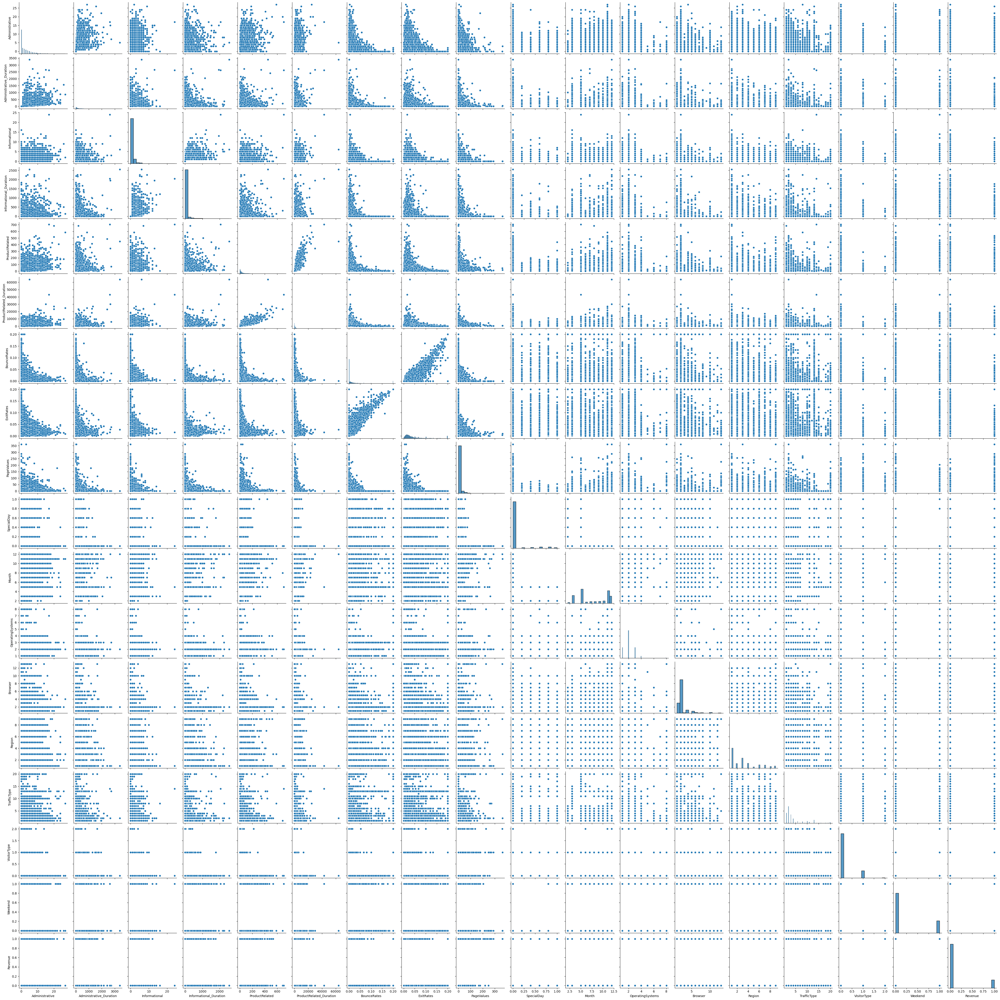

In [20]:
# Use a pairplot to determine correlations between all features and "Revenue"
sns.pairplot(shop_df)
plt.show()

# Perform a train-test split

Consulted scikit-learn for the documentation for train_test_split
https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

In [21]:
# Create X and y values
X = shop_df.iloc[:, :-1]
y = shop_df.iloc[:, -1]

# Split X and y values into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=42, shuffle=True, stratify=y)

# Merge the training and testing sets

In [22]:
# Concat training X and y into one df
train = pd.concat([X_train, y_train], axis=1)

# Concat testing X and y into one df
test = pd.concat([X_test, y_test], axis=1)

# Self-Developed Perceptron Algorithm (with all features)

Below are the metrics with regards to the online shoppers df.
 
{'accuracy': 0.7262085918295681, 'sensitivity': 0.125, 'specificity': 0.837657832662689, 'precision': 0.12490650710545999, 'f1-score': 0.12495323606434719}
 


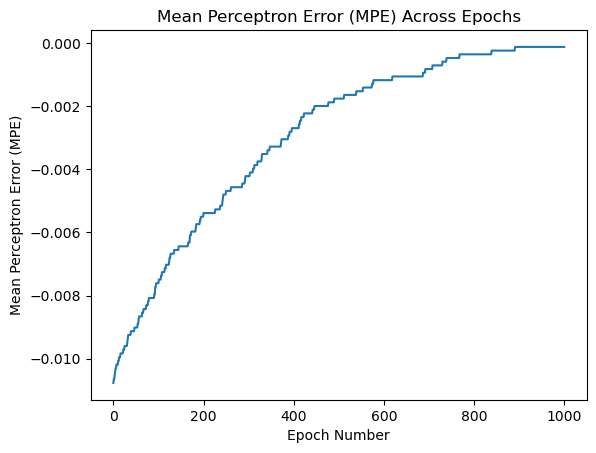

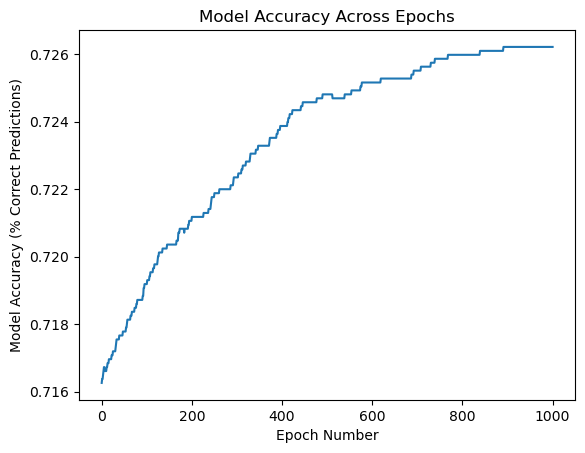

In [23]:
# Implement the perceptron model on each validation set
all_features_final_metrics = cross_validation_perceptron(train, ml.perceptron)

In [24]:
# Create a list of column names for function to take in 
col_lst = ["Administrative", "Administrative_Duration", "Informational", "Informational_Duration", "ProductRelated", 
           "ProductRelated_Duration", "BounceRates", "ExitRates", "PageValues", "SpecialDay", "Month", 
           "OperatingSystems", "Browser", "Region", "TrafficType", "VisitorType", 
           "Weekend", "num_features", "accuracy", "sensitivity", "specificity", 
           "precision", "f1-score"]

# Run the generate table function for all features
all_features_model_table = generate_table(train, col_lst)
print(all_features_model_table)

C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:298: RuntimeWarning: invalid value encountered in double_scalars
  scores["f1-score"] = 2 * ((scores["precision"] * scores["sensitivity"])


    Administrative  Administrative_Duration  Informational  \
0                1                        0              0   
1                0                        0              0   
2                0                        0              0   
3                1                        1              1   
4                0                        0              0   
5                1                        1              0   
6                0                        1              0   
7                0                        0              0   
8                0                        0              0   
9                0                        0              0   
10               1                        1              1   
11               1                        1              0   
12               1                        1              1   
13               0                        0              1   
14               1                        1              1   
15      

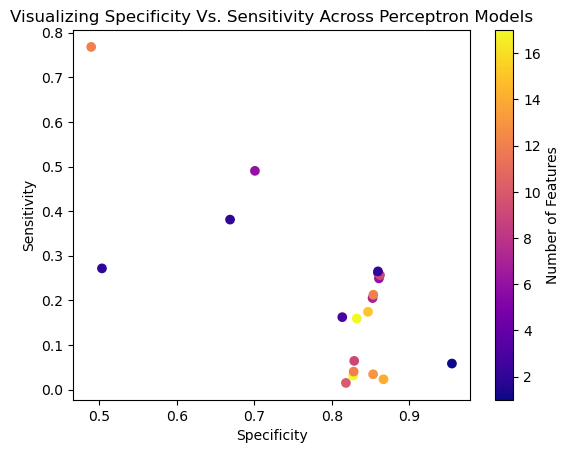

In [25]:
# Run plot_model_metrics function on all_features_model_table
plot_model_metrics(all_features_model_table)

# Scikit-learn's Perceptron Algorithm (with all features)

In [26]:
# Run the cross_validation_sklearn_perceptron function on train data
all_features_five_metrics = cross_validation_sklearn_perceptron(train)

In [27]:
# Print statements
print("Below are the metrics with regards to the online shoppers df for scikit-learn's model.")
print(" ")
print(all_features_five_metrics)
print(" ")

Below are the metrics with regards to the online shoppers df for scikit-learn's model.
 
{'accuracy': 0.8726442701627063, 'sensitivity': 0.23577844311377247, 'specificity': 0.9907034827251283, 'precision': 0.824607329842932, 'f1-score': 0.3667054714784634}
 


# Decision Tree Algorithm (with all features)

In [28]:
# Run dtree function
dtree_model = tree.dtree(train, tree.entropy, max_depth=4)
print(dtree_model)

((((('Month', 11, 5670, 0, 0.20980027391777156, 4, None, None,        Administrative  Administrative_Duration  Informational  \
2965                0                 0.000000              0   
6358                9               179.378571              0   
10029               0                 0.000000              0   
1956                1                38.000000              0   
10673               7                98.172619              0   
...               ...                      ...            ...   
2434                1                 3.000000              0   
2582                0                 0.000000              4   
10470               0                 0.000000              0   
916                12               285.011905              0   
10073               8               105.000000              1   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
2965                      0.0               9               953.833333   
6358    

In [97]:
# Predict results from dtree_model
dtree_model_preds = tree.predict(dtree_model, train)

# Calculate the five metrics scores
acc = ml.metrics(train["Revenue"], dtree_model_preds)

print(dtree_model_preds)
print(" ")
print("Below are the metric scores:")
print(acc)

2965     0
6358     0
10029    0
1956     0
10673    0
        ..
2582     0
8697     0
10470    0
916      0
10073    0
Name: predictions, Length: 8543, dtype: object
 
Below are the metric scores:
{'accuracy': 0.888797846189863, 'sensitivity': 0.46032934131736525, 'specificity': 0.9682253364784238, 'precision': 0.7286729857819905, 'f1-score': 0.5642201834862385}


# SciKit-Learn's Decision Tree Algorithm (all features)

Consulted scikit-learn for the documentation for DecisionTreeClassifier()
https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

In [98]:
# Create a model object instance
clf = DecisionTreeClassifier()

# Train the model
clf = clf.fit(X = X_train, y = y_train)

# Predict the classes using test instances
y_pred = clf.predict(X_test)

# Print classification report
print(metrics.classification_report(y_test, y_pred, target_names=["0", "1"]))

# Print the five metric scores
print("Below are the metric scores:")
print(ml.metrics(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.92      0.91      0.91      3090
           1       0.54      0.56      0.55       572

    accuracy                           0.86      3662
   macro avg       0.73      0.74      0.73      3662
weighted avg       0.86      0.86      0.86      3662

Below are the metric scores:
{'accuracy': 0.8552703440742764, 'sensitivity': 0.5611888111888111, 'specificity': 0.9097087378640777, 'precision': 0.535, 'f1-score': 0.5477815699658702}


In [31]:
# Create a decision tree graph and export as png
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, 
                feature_names=X_train.columns, class_names=["0", "1"])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png("rph_all_features.png")
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.899698 to fit

(process:39260): GLib-GIO-WARNING **: 21:19:08.169: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:39260): GLib-GIO-WARNING **: 21:19:08.185: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2302.20.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.899698 to fit

(process:26744): GLib-GIO-WARNING **: 21:19:14.700: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.5.15.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:26744): GLib-GIO-WARNING **: 21:19:14.715: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2302.20.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') s

# Implement 10-fold cross validation

In [32]:
# Split train data into 10 folds of train and valid
train_folds, valid_folds = tree.split_folds(train, folds=10)

print(valid_folds)

[       Administrative  Administrative_Duration  Informational  \
4330                0                 0.000000              0   
10280               2               167.888889              2   
2500                0                 0.000000              0   
8650                0                 0.000000              0   
11940               0                 0.000000              0   
...               ...                      ...            ...   
4770                2                86.000000              0   
5730               11               189.483333              1   
8500                0                 0.000000              3   
1110                0                 0.000000              0   
10470               0                 0.000000              0   

       Informational_Duration  ProductRelated  ProductRelated_Duration  \
4330                      0.0               8               129.000000   
10280                   825.5             117              5256.472341

In [33]:
# Combine the 10 valid folds into one df
valid = pd.concat(valid_folds, ignore_index=True)

print(valid)

      Administrative  Administrative_Duration  Informational  \
0                  0                 0.000000              0   
1                  2               167.888889              2   
2                  0                 0.000000              0   
3                  0                 0.000000              0   
4                  0                 0.000000              0   
...              ...                      ...            ...   
8538               2                83.600000              1   
8539               2                22.200000              0   
8540               5                80.000000              0   
8541              11               373.620000              9   
8542               9               183.708333              1   

      Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                        0.0               8               129.000000   
1                      825.5             117              5256.472341   
2           

In [34]:
# Set the X and y values of the valid folds df
X_valid = valid.iloc[:, :-1]
y_valid = valid.iloc[:, -1]

print(X_valid, y_valid)

      Administrative  Administrative_Duration  Informational  \
0                  0                 0.000000              0   
1                  2               167.888889              2   
2                  0                 0.000000              0   
3                  0                 0.000000              0   
4                  0                 0.000000              0   
...              ...                      ...            ...   
8538               2                83.600000              1   
8539               2                22.200000              0   
8540               5                80.000000              0   
8541              11               373.620000              9   
8542               9               183.708333              1   

      Informational_Duration  ProductRelated  ProductRelated_Duration  \
0                        0.0               8               129.000000   
1                      825.5             117              5256.472341   
2           

# Feature Selection

## Tree-Based Feature Selection

Consulted scikit-learn for feature selection techniques
https://scikit-learn.org/stable/modules/feature_selection.html

Consulted scikit-learn for selecting features based on importance
https://scikit-learn.org/stable/auto_examples/feature_selection/plot_select_from_model_diabetes.html#sphx-glr-auto-examples-feature-selection-plot-select-from-model-diabetes-py

Here is the shape of the training df comprising all features: (8543, 17)
 
Here are the importances of all the features: [0.05135579 0.04818449 0.02927823 0.02869371 0.06611253 0.06241248
 0.05419237 0.07353983 0.35415736 0.00674836 0.04942409 0.03138087
 0.03032774 0.04288167 0.04189336 0.01366307 0.01575403]
 
Here is the shape of the training df comprising the tree-based selected features: (8543, 4)
 
Features selected by SelectFromModel: ['ProductRelated' 'ProductRelated_Duration' 'ExitRates' 'PageValues']
 


C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


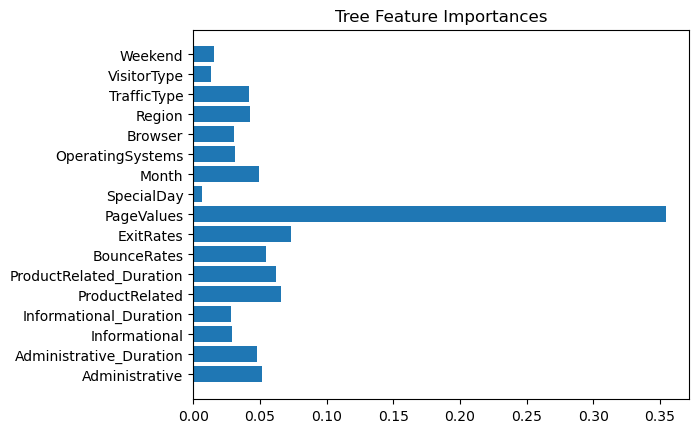

In [35]:
print("Here is the shape of the training df comprising all features:", X_valid.shape)
print(" ")

# Create model object instance
clf = ExtraTreesClassifier(n_estimators=50)

# Train model
clf = clf.fit(X_valid, y_valid)

print("Here are the importances of all the features:", clf.feature_importances_)
print(" ")

# Create an arary of feature names from X_valid.columns
feature_names = np.array(X_valid.columns)

# Select features from model
model = SelectFromModel(clf, prefit=True)

# Transform the model
X_valid_new = model.transform(X_valid)

print("Here is the shape of the training df comprising the tree-based selected features:", X_valid_new.shape)
print(" ")

print(f"Features selected by SelectFromModel: {feature_names[model.get_support()]}")
print(" ")

# Create horizontal barplot
plt.barh(feature_names, clf.feature_importances_)
plt.title("Tree Feature Importances")
plt.show()

## Feature selection as part of a pipeline/tree’s feature importance from Mean Decrease in Impurity (MDI)

Consulted scikit-learn for a tree's feature importance from Mean Decrease in Impurity (MDI)
https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py

ProductRelated             0.153391
ProductRelated_Duration    0.181192
ExitRates                  0.193076
PageValues                 0.472342
dtype: float64


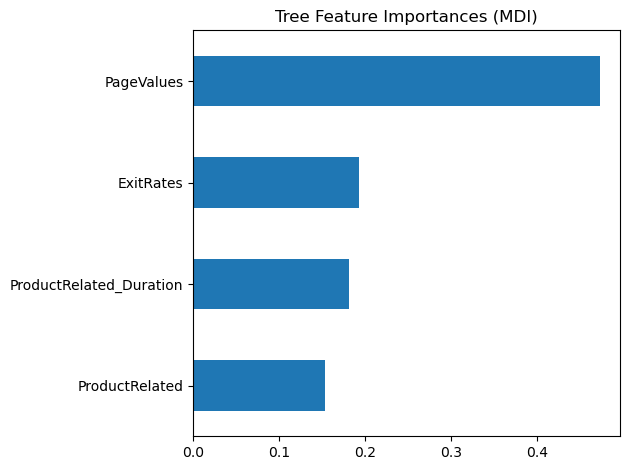

In [36]:
# Create model object instance
clf = ExtraTreesClassifier()

# Train the model
clf.fit(X_valid, y_valid)

# Create a pipeline for feature selection
et = Pipeline([("feature_selection", SelectFromModel(clf, prefit=True)),
               ("classification", ExtraTreesClassifier())])

# Train the model
et.fit(X_valid, y_valid)
    
# Get the indices of columns that are selected
feature_idx = et.named_steps["feature_selection"].get_support()

# Get the feature names of the selected columns
feature_names = X_valid.columns[feature_idx].tolist()

# Create mean decreasing impurity matrix
mdi_importances = pd.Series(
    et.named_steps["classification"].feature_importances_, index=feature_names
).sort_values(ascending=True)

print(mdi_importances)

# Create horizontal barplot
ax = mdi_importances.plot.barh()
ax.set_title("Tree Feature Importances (MDI)")
ax.figure.tight_layout()
plt.show()

In [37]:
# Create a list of selected features columns
selected_features = ["ProductRelated", "ProductRelated_Duration", "ExitRates", "PageValues", "Revenue"]

# Create a df of test data with only selected features column values
test_selected_features = test.loc[:, test.columns.isin(selected_features)]

# Self-Developed Perceptron Algorithm (with selected features)

Below are the metrics with regards to the online shoppers df.
 
{'accuracy': 0.491807755324959, 'sensitivity': 0.8566433566433567, 'specificity': 0.4242718446601942, 'precision': 0.21595416483032173, 'f1-score': 0.34494896163322775}
 


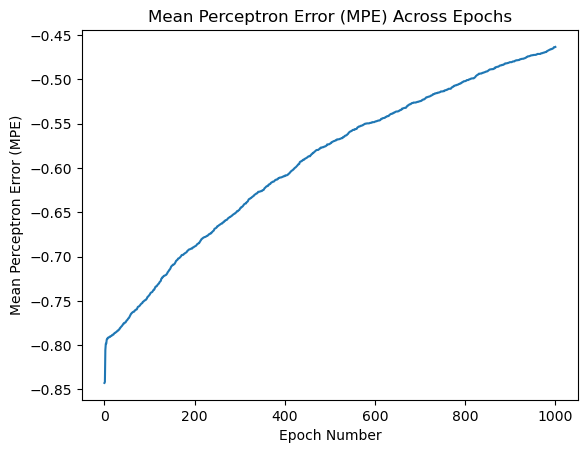

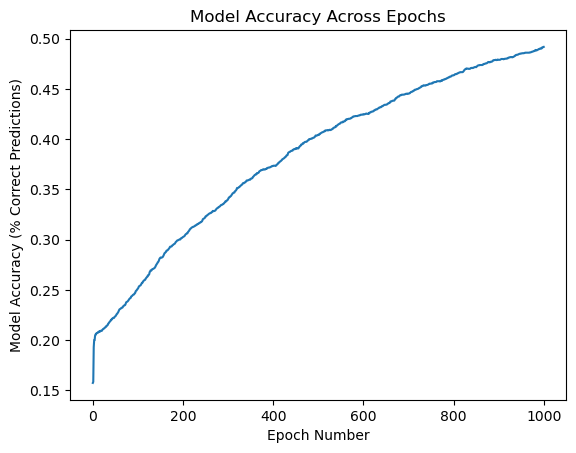

In [38]:
# Run cross_validation_perceptron function
selected_features_final_metrics = cross_validation_perceptron(test_selected_features, ml.perceptron)

In [39]:
# Run generate table function for selected features
selected_features_model_table = generate_table(test_selected_features, ["ProductRelated", "ProductRelated_Duration", "ExitRates", "PageValues", "num_features", "accuracy", "sensitivity", "specificity", "precision", "f1-score"])
print(selected_features_model_table)

C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:298: RuntimeWarning: invalid value encountered in double_scalars
  scores["f1-score"] = 2 * ((scores["precision"] * scores["sensitivity"])
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:298: RuntimeWarning: invalid value encountered in double_scalars
  scores["f1-score"] = 2 * ((scores["precision"] * scores["sensitivity"])
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:298: RuntimeWarning: invalid value encountered in double_scalars
  scores["f1-score"] = 2 * ((scores["precis

    ProductRelated  ProductRelated_Duration  ExitRates  PageValues  \
0                1                        1          1           1   
1                1                        0          1           1   
2                1                        1          1           1   
3                1                        1          1           1   
4                0                        1          1           0   
5                1                        0          1           0   
6                0                        1          0           1   
7                0                        1          0           1   
8                1                        0          0           0   
9                1                        0          0           1   
10               1                        1          1           0   
11               1                        0          0           1   
12               1                        1          0           0   
13               0  

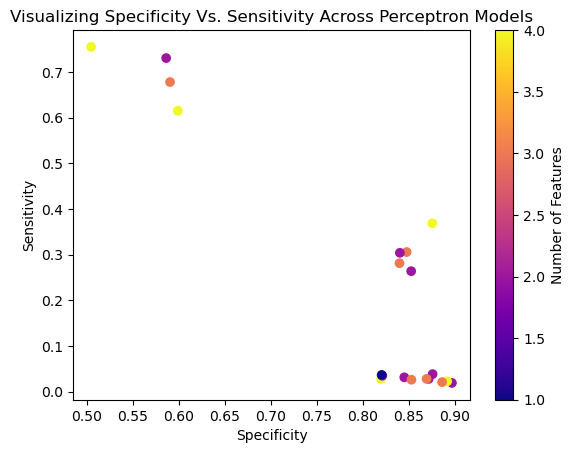

In [40]:
# Run plot_model_metrics function on selected_features_model_table
plot_model_metrics(selected_features_model_table)

# SciKit-Learn's Perceptron Algorithm (with selected features)

In [41]:
# Run cross_validation_sklearn_perceptron function
selected_features_five_metrics = cross_validation_sklearn_perceptron(test_selected_features)

In [42]:
# Print statements
print("Below are the metrics with regards to the online shoppers df for scikit-learn's model.")
print(" ")
print(selected_features_five_metrics)
print(" ")

Below are the metrics with regards to the online shoppers df for scikit-learn's model.
 
{'accuracy': 0.8787547788093938, 'sensitivity': 0.3094405594405594, 'specificity': 0.9841423948220065, 'precision': 0.7831858407079646, 'f1-score': 0.44360902255639095}
 


# Decision Tree Hyperparameter Tuning

In [47]:
# Run find_splitting_criterion function
tree.find_splitting_criterion(valid, "Revenue", tree.gini, tree.entropy, 4)

<function entropy at 0x000001B5A968DEE0> is the optimal splitting criterion.


In [44]:
# Get subset of the validation data
subset = valid.sample(200)

Consulted tutorialspoint for getting the first element with the maximum value in a list of tuples in Python
https://www.tutorialspoint.com/get-first-element-with-maximum-value-in-list-of-tuples-in-python#:~:text=With%20itemgetter%20and%20max%20With%20itemgetter%20%281%29%20we,the%20first%20tuple%20with%20maximum%20element%20in%20it.

In [48]:
# Create a list of depth values
dp_list = [x for x in range(1, 20)]

# Run find_maxd function
depth_acc_lst = tree.find_maxd(subset, "Revenue", tree.entropy, dp_list)

# Find the best depth value from list
best_depth = max(depth_acc_lst, key=itemgetter(1))[0]

print(depth_acc_lst)

C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)


[(1, 0.895), (2, 0.895), (3, 0.9), (4, 0.9), (5, 0.905), (6, 0.91), (7, 0.91), (8, 0.91), (9, 0.91), (10, 0.91), (11, 0.91), (12, 0.91), (13, 0.91), (14, 0.91), (15, 0.91), (16, 0.91), (17, 0.91), (18, 0.91), (19, 0.91)]


In [49]:
# Create a list of values
min_instance_list = [x for x in range(2, 10)]

# Run find_min_examples function
min_instance_acc_lst = tree.find_min_examples(subset, "Revenue", tree.entropy, best_depth, min_instance_list)

# Find the best min_instances value from list
best_min_instances = max(min_instance_acc_lst, key=itemgetter(1))[0]

print(min_instance_acc_lst)

C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)


[(2, 0.91), (3, 0.895), (4, 0.895), (5, 0.895), (6, 0.895), (7, 0.895), (8, 0.895), (9, 0.895)]


C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)


In [50]:
# Create list of values
impurity_lst = list(np.arange(0.0, 1.0, 0.1))

# Run find_target_impurity function
impurity_acc_lst = tree.find_target_impurity(subset, "Revenue", tree.entropy, best_depth, best_min_instances, impurity_lst)

# Find best impurity score
best_impurity = max(impurity_acc_lst, key=itemgetter(1))[0]

print(impurity_acc_lst)

C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)
C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)


[(0.0, 0.91), (0.1, 0.91), (0.2, 0.91), (0.30000000000000004, 0.91), (0.4, 0.895), (0.5, 0.895), (0.6000000000000001, 0.895), (0.7000000000000001, 0.895), (0.8, 0.895), (0.9, 0.895)]


C:\Users\zheng\Documents\Spring2023\DS4400\shoppers-purchase-intention\mltools.py:297: RuntimeWarning: invalid value encountered in long_scalars
  scores["precision"] = TP / (TP + FP)


# Self-Developed Decision Tree Algorithm (with selected features and optimal hyperparameters)

In [51]:
# Print an optimized decision tree using the test set filtered by the selected features
# as well as the optimal hyperparameters
best_model = tree.dtree(test_selected_features, tree.entropy, depth=0, max_depth=best_depth, 
                        min_instances=best_min_instances, target_impurity=best_impurity)
print(best_model)

((((((('ExitRates', 0.2, 2851, 0, 0.24936229934550158, 6, None, None,        ProductRelated  ProductRelated_Duration  ExitRates  PageValues  Revenue
11868              11               370.458333   0.003077         0.0        0
9947               39              1020.013889   0.014226         0.0        0
3545               15               143.750000   0.091556         0.0        0
5298                2               121.000000   0.050000         0.0        0
5459                2                 7.000000   0.100000         0.0        0
...               ...                      ...        ...         ...      ...
700                 1                40.000000   0.100000         0.0        0
1312               25               437.222222   0.035000         0.0        0
3938               20               525.666667   0.004545         0.0        0
10361              27               677.883333   0.006061         0.0        0
4713               60              1147.615584   0.024417    

In [99]:
# Make predictions for the optimized tree
best_model_preds = tree.predict(best_model, test_selected_features)

# Attain the accuracy for the model, using the predictions above
acc = ml.metrics(test_selected_features["Revenue"], best_model_preds)

# Print the predictions and the metric scores
print(best_model_preds)
print(" ")
print("Below are the metric scores:")
print(acc)

11868    0
9947     0
3545     0
5298     0
4651     0
        ..
5217     0
1312     0
3938     0
10361    0
4713     0
Name: predictions, Length: 3662, dtype: object
 
Below are the metric scores:
{'accuracy': 0.8850354997269252, 'sensitivity': 0.3986013986013986, 'specificity': 0.9750809061488673, 'precision': 0.7475409836065574, 'f1-score': 0.5199543899657925}


# SciKit-Learn's Decision Algorithm (selected features and hyperparameter tuning)

In [53]:
# Generate a list of the features selected through feature selection
selected_features = ["ProductRelated", "ProductRelated_Duration", "ExitRates", "PageValues", "Revenue"]

# Filter shop_df based on the selected features
shop_df_selected_features = shop_df.loc[:, shop_df.columns.isin(selected_features)]

In [54]:
# Split shop_df_selected_features into its features and class column
X_selected_features = shop_df_selected_features[shop_df_selected_features.columns[:-1]]
y_selected_features = shop_df_selected_features[shop_df_selected_features.columns[-1]]

# Print X_selected_features and y_selected_features to confirm the outputs
print(X_selected_features)
print(y_selected_features)

       ProductRelated  ProductRelated_Duration  ExitRates  PageValues
2993               30              1708.083333   0.013333   16.189200
12318               6               279.000000   0.033333    0.000000
4074               11               443.000000   0.041176    0.000000
6425               54              1256.293333   0.014368    0.000000
5596              145              5175.377371   0.008978    2.042762
...               ...                      ...        ...         ...
11063               1                 0.000000   0.200000    0.000000
920                30              1281.000000   0.020000    0.000000
5273                2                32.000000   0.100000    0.000000
12297               6               139.750000   0.066667    0.000000
238                 9               478.000000   0.011111    0.000000

[12205 rows x 4 columns]
2993     1
12318    0
4074     0
6425     0
5596     1
        ..
11063    0
920      0
5273     0
12297    0
238      0
Name: Revenue

In [55]:
# Perform a train-test split using X_selected_features and y_selected_features
X_train_sel_feat, X_test_sel_feat, y_train_sel_feat, y_test_sel_feat = train_test_split(X_selected_features, y_selected_features, train_size=0.7, random_state=42, shuffle=True, stratify=y_selected_features)

In [57]:
# Create a model object instance
clf = DecisionTreeClassifier()

In [58]:
# Establish a grid for parameters of DecisionTreeClassifier()
params = {"criterion": ["gini", "entropy", "log_loss"], 
         "max_depth": np.arange(1, 20), 
         "min_samples_split": np.arange(1, 20)}

# Establish a grid for GridSearchCV using 10-fold-cross-validation
clf_grid = GridSearchCV(estimator=clf, param_grid=params, cv=10)

# Fit the GridSearchCV grid to the features and target of the training set
# filtered for the selected features
clf_grid.fit(X_train_sel_feat, y_train_sel_feat)

# Print the best parameters and best accuracy of DecisionTreeClassifier()
print(clf_grid.best_params_)
print(clf_grid.best_score_)

{'criterion': 'entropy', 'max_depth': 4, 'min_samples_split': 2}
0.8965208102222771


C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
570 fits failed out of a total of 10830.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
570 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\sklearn\tree\_classes.py", line 969, in fit
    super().fit(
  File "C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\sklearn\tree\_classes.py", line 265, in fit
    check_scalar(
  File "C:\Users\zheng\anaconda3\envs\ml\lib\sit

In [100]:
# Create a model object instance
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4, min_samples_split=2)

# Train the model
clf = clf.fit(X = X_train_sel_feat, y = y_train_sel_feat)

# Predict the classes using test instances
y_pred = clf.predict(X_test_sel_feat)

# Print the classification report of the DecisionTreeClassifier()
print(metrics.classification_report(y_test, y_pred, target_names=["0", "1"]))

# Print the five metric scores
print("Below are the metric scores:")
print(ml.metrics(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.96      0.93      3090
           1       0.67      0.50      0.57       572

    accuracy                           0.88      3662
   macro avg       0.79      0.73      0.75      3662
weighted avg       0.87      0.88      0.88      3662

Below are the metric scores:
{'accuracy': 0.8836701256144184, 'sensitivity': 0.4965034965034965, 'specificity': 0.9553398058252427, 'precision': 0.6729857819905213, 'f1-score': 0.5714285714285714}


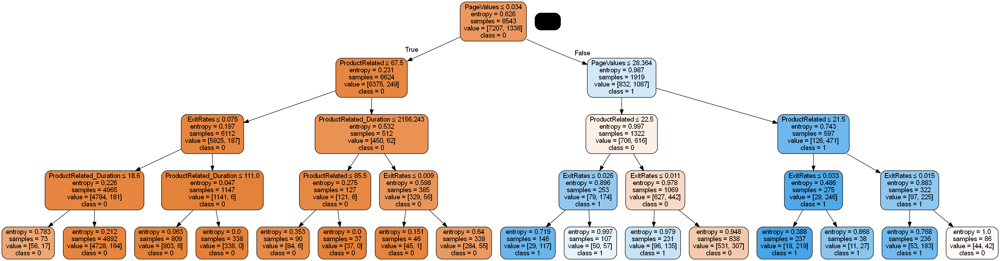

In [61]:
# Create a decision tree graph and export as png
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train_sel_feat.columns, class_names=["0", "1"])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png("rph_selected_features.png")
Image(graph.create_png())

# Keras's Neural Networks for Classification

Consulted towardsdatascience for classification-based neural networks
https://towardsdatascience.com/a-brief-introduction-to-neural-networks-a-classification-problem-43e68c770081

In [62]:
# Print the feature training and testing sets and their dimensions
print(f"The training data shape: {X_train.shape}, its label shape: {y_train.shape}")
print(f"The test data shape: {X_test.shape}, its label shape: {y_test.shape}")

The training data shape: (8543, 17), its label shape: (8543,)
The test data shape: (3662, 17), its label shape: (3662,)


In [63]:
# Print the minimum and maximum values of the feature training set
print("Minimum value:", np.min(X_train))
print("Maximum value:", np.max(X_train))

Minimum value: Administrative             0.0
Administrative_Duration    0.0
Informational              0.0
Informational_Duration     0.0
ProductRelated             0.0
ProductRelated_Duration    0.0
BounceRates                0.0
ExitRates                  0.0
PageValues                 0.0
SpecialDay                 0.0
Month                      2.0
OperatingSystems           1.0
Browser                    1.0
Region                     1.0
TrafficType                1.0
VisitorType                0.0
Weekend                    0.0
dtype: float64
Maximum value: Administrative                24.000000
Administrative_Duration     3398.750000
Informational                 16.000000
Informational_Duration      2549.375000
ProductRelated               518.000000
ProductRelated_Duration    63973.522230
BounceRates                    0.200000
ExitRates                      0.200000
PageValues                   361.763742
SpecialDay                     1.000000
Month                       

C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.min(axis=None) will return a scalar min over the entire DataFrame. To retain the old behavior, use 'frame.min(axis=0)' or just 'frame.min()'
  return reduction(axis=axis, out=out, **passkwargs)
C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\numpy\core\fromnumeric.py:84: FutureWarning: In a future version, DataFrame.max(axis=None) will return a scalar max over the entire DataFrame. To retain the old behavior, use 'frame.max(axis=0)' or just 'frame.max()'
  return reduction(axis=axis, out=out, **passkwargs)


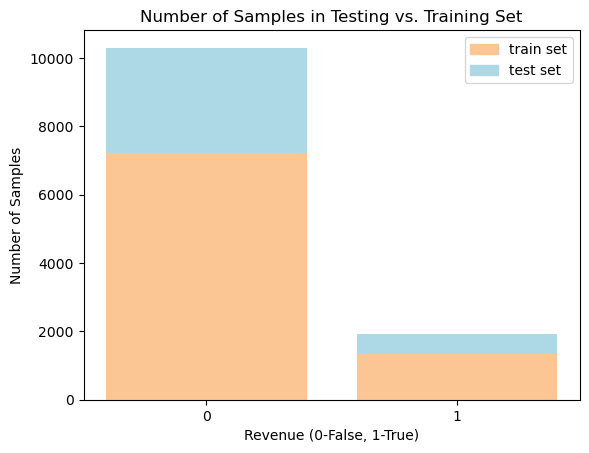

In [65]:
# Find the number of 0s and 1s in the ytrain and test
y_train_0 = (y_train == 0).sum()
y_test_0 = (y_test == 0).sum()

y_train_1 = (y_train == 1).sum()
y_test_1 = (y_test == 1).sum()

# Create a stacked bar plot visualizing the split
x = ["0", "1"]
y1 = [y_train_0, y_train_1]
y2 = [y_test_0, y_test_1]

# Create the legend
colors = {'train set':'#FCC594', 'test set':'lightblue'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels)

# Display the plot
plt.bar(x, y1, color='#FCC594')
plt.bar(x, y2, bottom=y1, color='lightblue')
plt.xlabel("Revenue (0-False, 1-True)")
plt.ylabel("Number of Samples")
plt.title("Number of Samples in Testing vs. Training Set")
plt.show()

In [66]:
# Normalize the data
mean = X_train.mean(axis=0)
std = X_train.std(axis=0)
X_train = (X_train - mean) / std
X_test = (X_test - mean) / std

In [67]:
# Define the model
model = Sequential()
model.add(Dense(128, activation="relu", input_shape=(X_train.shape[1],)))
model.add(Dropout(.2))
model.add(Dense(64, activation="relu"))
model.add(Dropout(.2))
model.add(Dense(1))

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               2304      
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 10,625
Trainable params: 10,625
Non-trainable params: 0
_________________________________________________________________


In [68]:
# Compile the model
model.compile(optimizer="Adam", loss="mse", metrics=["mae", "accuracy"])

# Train the model
history = model.fit(X_train, y_train, epochs=10, batch_size=2, verbose=0, validation_split=0.2)

C:\Users\zheng\anaconda3\envs\ml\lib\site-packages\tensorflow\python\keras\engine\data_adapter.py:1516: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


In [69]:
# Evaluate the model
mse, mae, acc = model.evaluate(X_test, y_test, verbose=0)
print(f'Test MSE: {mse:.3f}, Test MAE: {mae:.3f}')

# Make predictions
y_pred = model.predict(X_test)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(ml.calculate_mean_squared_error(y_test, y_pred))
print(f'Test RMSE: {rmse:.3f}')

# Calculate total MAE
t_mae = ml.calculate_mean_absolute_error(y_test, y_pred)

print(f'Test MAE: {t_mae:.3f}')

Test MSE: 0.080, Test MAE: 0.152
Test RMSE: 0.421
Test MAE: 0.249


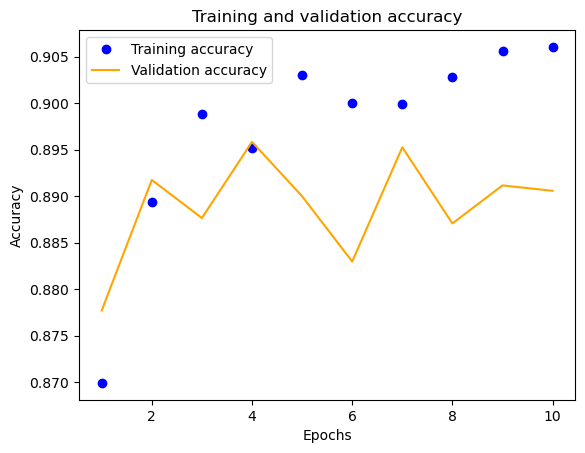

0.8958455324172974

In [70]:
# Print the training and validation accuracies
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Establish a range of epochs for model iteration
epochs = range(1, len(acc) + 1)

# Plot the epochs vs. model accuracy
# "bo" is for blue dot
# "orange" is for orange line
plt.plot(epochs, acc, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Attain the highest validation accuracy
np.max(val_acc)

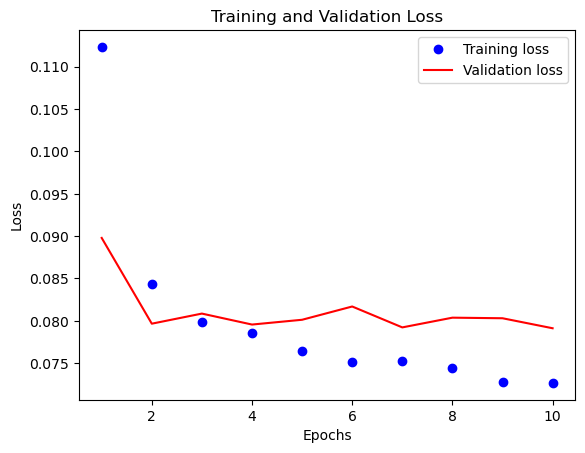

0.07912349700927734

In [72]:
# Print the training and validation losses
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Establish a range of epochs for model iteration
epochs = range(1, len(train_loss) + 1)

# Plot the epochs vs. model loss
# "bo" is for blue dot
# "r" is for red line
plt.plot(epochs, train_loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Attain the lowest validation loss
np.min(val_loss)

In [101]:
# Instantiate the predictions for the model
preds = np.round(model.predict(X_test), 0)

# Print the confusion matrix comparing the test classes and predicted classes
print(metrics.confusion_matrix(y_test, preds))

# Print a classificstion report illustrating the same information
print(metrics.classification_report(y_test, preds))

# Print the five metric scores
print("Below are the metric scores:")
print(ml.metrics(y_test, y_pred))

[[3002   88]
 [ 307  265]]
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      3090
           1       0.75      0.46      0.57       572

    accuracy                           0.89      3662
   macro avg       0.83      0.72      0.76      3662
weighted avg       0.88      0.89      0.88      3662

Below are the metric scores:
{'accuracy': 0.8836701256144184, 'sensitivity': 0.4965034965034965, 'specificity': 0.9553398058252427, 'precision': 0.6729857819905213, 'f1-score': 0.5714285714285714}


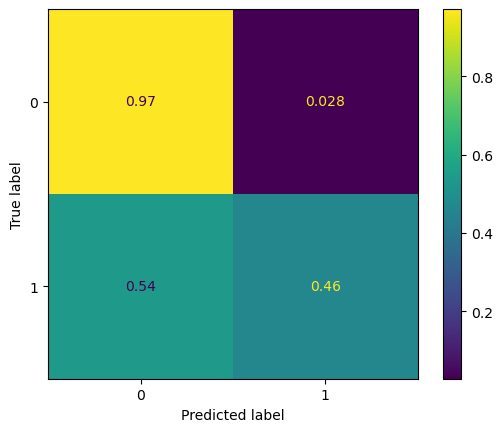

In [75]:
# Plot the confusion matrix outlined above
metrics.ConfusionMatrixDisplay.from_predictions(y_test, preds, normalize='true')
plt.show()